# CS5242 Final Project Reports

### Authors: Team 23 --- **Shao Guoxin(A0232474H)**, **Deng Yichao(A0242114X)**, **Zhang Delong**

### **Abstraction**

During the pandemic, wearing a mask is becoming more and more significant. In some countries, masks even become a part of daily life for most people.

Therefore, many applications that are related to human face to work are also facing challenges on accuracy due to less information being collected through a masked face. For example, For face detection function that used for unlocking smartphone like FaceID, with mask weared, the device need to using only half part of faces to determine whether it is from its user or not, compared with in the past that full faces avaliable, the information of mouse, cheek and nose are no longer accessed. And for many computer vision algorithm, detecting a human masked face and categorize it into human is also important, however masked faces are obviously different from normal no-masked faces, so alternation is necessary for those classification algorithm.

The first step to improve those algorithm is by categorizing whether the image that posed to the application is a human-masked face, that is, given pictures of human masked faces, human no-masked faces and nonhuman pictures, designing algorithms using deep learning to learn the characteristics of these pictures and using the algorithm to predict whether for some new pictures there are correspoding masked/no-masked human faces and nonhuman parts contained.
Problem Description

For past two years, the prevailing view was **face-with-mask** represented a huge challenge to facial recognition. However, we still need traditional facial detection systems to work during the pandemic. As shown in Figures.

<p>
<img src="http://www.xinhuanet.com/english/2019-09/27/138428955_15695888042401n.jpg" width="400">
</p>


Payment Device 1 (image from xinhuanet.com).


<img src="https://static.themoscowtimes.com/image/1360/1e/1F27B415-36F0-40BD-8182-4CD065EB47E7.jpeg" width="400">


Payment Device 2 (image from themoscowtimes.com).

<img src="https://img0.baidu.com/it/u=2560709678,2228068383&fm=26&fmt=auto" width="400">

Face verification (image from baidu.com)

It seemed obvious - algorithms designed to analyse faces would be less accurate if part of the face was concealed. And also, **takes off mask in public results in the risk of infection increasing**. Therefore,  we would like to solve this issue by adopting Deep Learning model.


The project comprises following parts:

   * Collecting data sets;
   * Selecting appropriate methods of deep learning network;
   * Building the networks;
   * Training and Testing these networks, comparing and analyzing the results;
   * Summarizing and future prospects.

Three picture categories:

  * Face with mask    => face with mask
  * Face without mask => face
  * No human face     => nonface

Final target: Finding best structure to distinguish three categories. We want to focus on face with mask detection in this project, and will give a try to do face 1:1 verification analysis.



## Table of Content

- [x] [Initialization](#initialization)
- [x] [Data Pre-Processing](#data-pre)
- [x] [A three layers MLP](#mlp)
- [x] [CNN Model](#cnn_model)
- [x] [CNN_RNN_Model](#cnn_rnn_model) 
- [x] [ANN Model](#ann_model)
- [x] [Training](#train)
- [x] [Evaluation](#evaluation)
- [x] [Conclusion](#conclusion)
- [x] [References](#ref)

## 1. **Initialization** <a name="initialization"></a>

Before start to check this notebook, you should be aware that following requirements are statisfied in your current environment.

---



**Note:** 

### Please always select the model first if you want to train or evaluate.

⏩ **This icon indicates that you can just run this cell once.**
      
🥊 **This red glove means you cannot skip this cell when your kernel is restarted.**

---



- Prepare environment.
- Mount your Google drive.
- Download data set from Internet.
- Unzip data and checking.
- Import packages

##### ⏩ Install required packages 

In [ ]:
!python -V
!pip install opencv-python Pillow matplotlib torchvision numpy gdown

##### 🥊 Check device availability 

In [ ]:
import torch
device = 'cpu'
if torch.cuda.is_available():
    gpu_name = torch.cuda.get_device_name(0)
    print("Using GPU", gpu_name)
    device = 'cuda'

print('Using Device:', device)

Using Device: cpu


##### 🥊 Import required packages 

In [ ]:
import os
import cv2
import random
import math
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
from torch.utils.data import Dataset
from torch.utils.data import Sampler
from torchvision import transforms
from torchvision.transforms import *
import sys
import torch
import torch.nn as nn
from torch.autograd import Variable
import numpy as np
import time
from os import path, chdir, getcwd, mkdir

##### 🥊 Mount your Google Drive (You can skip this when you running in local)

In [ ]:
GOOGLE_DRIVE_ROOT = '/content/drive/'
from google.colab import drive
drive.mount(GOOGLE_DRIVE_ROOT)

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


##### 🥊 Set up your working directory

In [ ]:

projectName = "cs5242_face_with_mask_detection"
projectDirectory = GOOGLE_DRIVE_ROOT + "My Drive/" + projectName
if getcwd() == "/content":
  if not path.isdir(projectDirectory):
    mkdir(projectDirectory)
    print(f"Project {projectName} has been created!")
  else:
    print(f"Project {projectName} already exist!")
  chdir(projectDirectory)

print(f"The current working directory is {getcwd()}")

Project cs5242_face_with_mask_detection already exist!
The current working directory is /content/drive/My Drive/cs5242_face_with_mask_detection


##### ⏩ Download data set and unzip

In [ ]:
DATA_SET_FOLDER = projectDirectory + '/data/'
DATA_ZIP = projectDirectory + '/dataset.zip'

if not path.isfile(DATA_ZIP):
    !gdown https://drive.google.com/u/0/uc?id=1QYLAtQwEcHOYb6VTI7jMTy6hGUo90wIM

if not path.isdir(DATA_SET_FOLDER):
    mkdir(DATA_SET_FOLDER)

print(os.getcwd())

!unzip dataset.zip


## DataSet & Data Pre-Processing <a name="data-pre"></a>

Load our `train_set` and `test_set` by `CNNRNNDataSet`
We load data from folder `"./train/"` and `"./test/"` for train and test respectively. And pre-process the data as following


---

![Data Processing](https://drive.google.com/uc?export=view&id=1oA_W4wV9YkuaAhOx4XjZ8rF28jJiTUyR)



##### ⏩  Data Visualization

Here the code is to calculate training/validation/testing sets size in term of three data types-'face', 'nomask' and 'nonface'. Also, we use matplot to visualize our results.

As from the results below, each of our data sets have approximately equal amount pictures of three different types.

In [ ]:
def get_value(root, split=0, train=False):
    imgs=[os.path.join(root,f) for f in os.listdir(root)]
    if split and train:
        count = len(imgs)
        imgs = imgs[:int(split * count)]
    elif split and not train:
        count = len(imgs)
        imgs = imgs[int(split * count):]
    nomask = nonface = face = 0
    for img in imgs:
        symbol = img.split('/')[-1].split('.')[0].split('_')[-1]
        if symbol == 'face': face += 1
        elif symbol == 'nomask': nomask += 1
        elif symbol == 'nonface': nonface += 1
    return [nonface, nomask, face]


data_dir = projectDirectory + '/data/'
train_dir = data_dir + 'train/'
test_dir = data_dir + 'test/'

train = get_value(train_dir, 0.85, True)
val = get_value(train_dir, 0.85, False)
test = get_value(test_dir, 0, False)
labels = ['noface', 'nomask', 'face']

print(train, val, test)

plt.bar(range(len(train)), train, width=0.6, tick_label=labels)
plt.show()
plt.bar(range(len(val)), val, width=0.6, tick_label=labels, fc='orange')
plt.show()
plt.bar(range(len(test)), test, width=0.6, tick_label=labels, fc='g')
plt.show()

import numpy as np

x = np.arange(3)
total_width, n = 0.8, 3
width = total_width / n
x = x - (total_width - width) / 2
 
plt.bar(x, train,  width=width, label='train')
plt.bar(x + width, val, width=width, label='val')
plt.bar(x + 2 * width, test, width=width, label='test')
plt.legend()
plt.show()

#### 🥊 Declare FaceSet

To make our results more reliable, we using the same data set and pre-processing data only once. 

**Pre-processing:** 

We first transfer these pictures into png and resize them into 100 * 100 pixels. 

Then for train set, we use some random flip to augment while remain same for test set.

After that we transform pixels into pytorch Tensor form for future training and testing.

Finally we transfer pictures into rgb mode.

In [ ]:
# define dataset
import torch.utils.data as data
import random
from PIL import Image

def read_image(path):
    return Image.open(path)

class FaceSet(data.Dataset):
    def __init__(self, is_train, transform):
        self.transform = transform
        self.label_map = {'face':2, 'nomask':1, 'nonface':0}
        self.data_dir = projectDirectory + '/data/'
        self.labels = []
        self.is_train = is_train
        
        if is_train:
            self.data_dir += 'train/'
        else:
            self.data_dir += 'test/'
        
        for fn in os.listdir(self.data_dir):
            fn = fn.replace('.png', '')
            self.labels.append(fn)

        print(f'loaded data from {self.data_dir}. dataset size {len(self)}')
        
    def __getitem__(self,index):
        name = self.labels[index]
        image = read_image(os.path.join(self.data_dir, f'{name}.png'))
        
        if image.mode == "RGBA":
            r, g, b, a = im.split ()
            image =Image.merge ("RGB", (r, g, b))
        elif image.mode!="RGB":
            image = image.convert ("RGB")
        image = self.transform(image)
        return image, self.label_map[name.split('_')[1]]

    def __len__(self):
        return len(self.labels)
a =FaceSet(is_train=False, transform = RandomCrop(100,100))
a[1]

loaded data from /content/drive/My Drive/cs5242_face_with_mask_detection/data/test/. dataset size 176


(<PIL.Image.Image image mode=RGB size=100x100 at 0x7F3DE1224A90>, 2)

In [ ]:
import time
import torch
import multiprocessing as mp
from torch.optim.lr_scheduler import ReduceLROnPlateau

class AverageMeter(object):
    """
    A utility class to compute statisitcs of losses and accuracies
    """

    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

def get_lr(optimizer):
    '''
    Get the current learning rate
    '''
    for param_group in optimizer.param_groups:
        return param_group['lr']


def topk_accuracy(k, outputs, targets):
    """
    Compute top k accuracy
    """
    batch_size = targets.size(0)

    _, pred = outputs.topk(k, 1, True)
    pred = pred.t()
    correct = pred.eq(targets.view(1, -1))
    n_correct_elems = correct.type(torch.FloatTensor).sum().item()

    return n_correct_elems / batch_size

## A three layers MLP <a name="mlp"></a>
We built a simple 3-layers MLP network to try out the simplest way and see its results at first. Each Linear layer is followed by a relu layer. The structure is as below.

| Layers |                            Structure(image size=100)                            |
|:------:|:---------------------------------------------------------------:|
| Block1 |                          Linear(30000, 100)                          |
| Block2 |                         Linear(100, 100)                         |
| Block3 |                         Linear(100, 3)                        |

**Improvement:** For original model, the performance is pretty bad(only reach about 35 percent accuracy after 50 epochs). So we tried increase the sturcture into following:

| Layers |                            Structure(image size=100)                            |
|:------:|:---------------------------------------------------------------:|
| Block1 |                          Linear(30000, 10000)                          |
| Block2 |                         Linear(10000, 100)                         |
| Block3 |                         Linear(100, 3)                        |

Now this structure will shows 85 percent accuracy after 50 epochs. However this network taks 401 million parameters which is too large so we discard it.

**Total Parameters:** About 3 million parameters.

![Data Processing](https://drive.google.com/uc?export=view&id=1KVQGfVncjxloilnFQWsuxDBnUxNRjNkY)

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class mlp(nn.Module):
    def __init__(self, input_size, hidden_size1, hidden_size2, output_size):
        super(mlp , self).__init__()
        self.layer1 = nn.Linear( input_size, hidden_size1 , bias=False)
        self.layer2 = nn.Linear( hidden_size1, hidden_size2 , bias=False)
        self.layer3 = nn.Linear( hidden_size2, output_size , bias=False)
        
    def forward(self, x):
        x = self.layer1(x)
        x = F.relu(x)
        x = self.layer2(x)
        x = F.relu(x)
        x = self.layer3(x)
        return x

mlp = [68.52, 68.52, 68.52, 68.52, 68.52, 68.52]

## CNN Model <a name="cnn_model"></a>

Our basic CNN model is using 4 convolutional layer with each layer followed by a MaxPoll2d layer, a BatchNorm layer and a Relu layer. Since the network is relatively shallow, we haven't add any Dropout.

| Layers |                            Structure                            |
|:------:|:---------------------------------------------------------------:|
| Block1 |                          Conv2d(3, 64)                          |
| Block2 |                         Conv2d(64, 128)                         |
| Block3 |                         Conv2d(128, 256)                        |
| Block4 |                         Conv2d(256, 512)                        |
| Block5 |                         Linear(8192, 512)                        |
| Block6 |                         Linear(512, 3)                        |

**Total Parameters:**

Convolutional Layers: 8640 parameters

Linear Layers: About 12 millions


In [ ]:
class cnn(nn.Module):
    def __init__(self):
        # With image size set to 64
        super(cnn, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1 ),
            nn.MaxPool2d(2,2), # 32
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1 ),
            nn.MaxPool2d(2,2), # 16
            nn.BatchNorm2d(128),
            nn.ReLU()
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1 ),
            nn.MaxPool2d(2,2), # 8
            nn.BatchNorm2d(256),
            nn.ReLU()
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, padding=1 ),
            nn.MaxPool2d(2,2), # 4
            nn.BatchNorm2d(512),
            nn.ReLU()
        )
        self.linear1 = nn.Linear(512 * 4 * 4, 512)
        self.linear2 = nn.Linear(512, 3)

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        
        x = x.view(-1, 512 * 4 * 7)
        x = self.linear1(x)
        x = F.relu(x)
        x = self.linear2(x)
        return x
    
def get_error( scores , labels ):
    bs=scores.size(0)
    predicted_labels = scores.argmax(dim=1)
    indicator = (predicted_labels == labels)
    num_matches=indicator.sum()
    
    return 1-num_matches.float()/bs  

def eval_on_test_set(loader):
    running_error=0
    num_batches=0
    for batch_idx,(img,label) in enumerate(loader):
        img=img
        img=img.to(device)
        scores=net(img) 
        label=label.to(device) 
        error = get_error( scores , label)
        running_error += error.item()
        num_batches+=1
    total_error = running_error/num_batches
    print( 'test error  = ', total_error*100 ,'percent')

**Performance:** In local test(50 epochs, lr=0.1 and lr=lr/1.5 every 10 epochs), this CNN could reach about 92 percent for top-1 classification accuracy.

cnn = [41.23, 11.11, 8.89, 7.22, 7.22, 8.33]

## CNN_RNN_Model <a name="cnn_rnn_model"></a>

#### *Base CNN Model + LSTM*

LSTM is more capable of handling long sequences than the 
standard RNN, which is subject to  the vanishing gradient 
problem with  the  growth  of  sequence  length. Therefore, we are using LSTM to imporve our model instead use standard RNN.


| Layers |                            Structure                            |
|:------:|:---------------------------------------------------------------:|
| Block1 |                          Conv2d(3, 64)                          |
| Block2 |                         Conv2d(64, 128)                         |
| Block3 |                         Conv2d(128, 256)                        |
| Block4 |                         Conv2d(256, 512)                        |
| Block5 |                         Conv2d(512, 512)                        |
|   RNN  | Linear(512 * 3 *3, 2048)<br>LSTM(2048, 2048)<br>Linear(2048, 3) |



In this model, what we did was just combine CNN model and LSTM model together [1] and expecting to get a better predictiion results. Now have a plain CNN 

$y(N_i, C_{out_j})=bias(C_{out_j}) + \sum^{C_in - 1}_{k=0} weight(C_{out},k) * input(N_i, k)$

Then we get the $y$ is 4 dimensions $y = (N,C_{out}, H_{out}, W_{out})$ then by using `unsqueeze()` convert $y$ to 2 dimensions, $x=(N,C * H * W)$

LSTM:

![alt LSTM](https://wikimedia.org/api/rest_v1/media/math/render/svg/7dee414820d5c0162ae1fff1899e58b08923944f)

Then we take the linear outputs as $x_t\in R^d$ which is the inputs of the LSTM unit. 


---
#### *Improve the Model*
The basic CNN +LSTM model does not work very well on the training data. After 10 epochs of training, it achieves about 75% top-1 classification accuracy on the validation dataset. Now, we tried two approaches to improve the basic model in order to get better performance.

**Augment the data (Dropped)**. The augmentation technique artificially expands the size of a training dataset by creating modified versions of images. It creates variations of the images that can improve the model's ability to generalize. we augmented the images by transforming the content 


**Regularization**. When overfitting happens, we managed to adopted the following techniques to adddress it and improve the generalization of the model:


*   L2 reguarization or weight decay. Weight decay regulates the weights of your network to be small values so that the model generalizes better. The scaling factor of the regularization term is controlled by the weight_decay parameter of the optimizer.
*   **Dropout** (nn.Dropout and nn.Dropout2d*). Dropout randomly drops out some activations in the cooresponding hidden layer during training. This makes the network more difficult to train, but often easier to generalize.




In [ ]:
import torch.nn as nn
from torchvision import * 
import torch.nn.functional as F

class Flatten(nn.Module):
    def forward(self, x):
        return x.view(x.size(0), -1)

class CNNRNNModel(nn.Module):

    def __init__(self):
        super().__init__()

        # Build the CNN feature extractor
        self.cnn = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256, affine=True),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512, affine=True),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)), 
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512, affine=True),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Dropout(p=0.5),
        )
        self.fc = nn.Linear(512  * 3 * 3, 2048, bias=True)
        self.relu = nn.ReLU()
        self.lstm = nn.LSTM(2048, 2048)
        self.fc2 = nn.Linear(2048, 3)
        
    def forward(self, image):
        feature = self.cnn(image)
        feature = self.fc(feature.flatten(1))
        feature,_ = self.lstm(self.relu(feature.unsqueeze(1)))
        return self.fc2(feature.flatten(1))
    
m = CNNRNNModel()
data = torch.randn(1, 3, 100, 100)
m(data)

tensor([[-0.0243,  0.0112,  0.0919]], grad_fn=<AddmmBackward0>)

The `CNNRNNModel` is larger enough which is prone to overfitting during training. Therefore, we removed one of `full-connected layer`(LinearLayer) from the original CNN layer and added a `LSTM` layer directly. In the latest version, Pytorch hold the implementation of tuple (H and C) inside the class, which means that we don't have to initialize it and update it manually.

## ANN_Model <a name="ann_model"></a>

#### **CBAM model**

**CBAM** also called **Convolutional Block Attention Module** which is showed in the following image, consists of **Channel Attention Module** and **Spatial Attention Module**.

![CBAM](https://drive.google.com/uc?export=view&id=1wo5OhEEYSqWHe2DUJ6pvruvxxuuw4CGD)

We embeded CBAM module into our convolutional network. 

Here is the architecture of our CBAM model: 

 Layers | Structure | Output_Size 
 --- | --- | ---
 Conv1 | Conv(3,16)+BN+ReLU | (16,100,100)
 Conv2 | Conv(16,32)+BN+ReLU+MaxPool | (32,50,50)
 Conv3 | Conv(32,64)+BN+ReLU+MaxPool | (64,25,25)
 CBAM | Channel_Attention+Spatial_Attention | (64,25,25)
 Conv4 | Conv(64,128)+BN+ReLU+MaxPool | (128,12,12)
 Conv5 | Conv(128,256)+BN+ReLU+MaxPool | (256,6,6)
 Conv6 | Conv(256,512)+BN+ReLU+MaxPool | (512,3,3)
 Linear | Linear(4608,3) | (3)

In [ ]:
# define CBAM network
class ChannelAttention(nn.Module):
    def __init__(self,in_planes,ratio):
        super(ChannelAttention,self).__init__()
        self.avg_pool=nn.AdaptiveAvgPool2d(1)
        self.max_pool=nn.AdaptiveMaxPool2d(1)
        self.sharedMLP=nn.Sequential(nn.Conv2d(in_planes,in_planes//ratio,1,bias=False),
                                    nn.ReLU(),nn.Conv2d(in_planes//ratio,in_planes,1,bias=False))
        self.sigmoid=nn.Sigmoid()
    
    def forward(self,x):
        avgout=self.avg_pool(x)
        avgout=self.sharedMLP(avgout)
        
        maxout=self.max_pool(x)
        maxout=self.sharedMLP(maxout)
        
        out=self.sigmoid(avgout+maxout)
        return out

class SpatialAttention(nn.Module):
    def __init__(self,kernel_size):
        super(SpatialAttention,self).__init__()
        self.padding=kernel_size//2
        self.conv=nn.Conv2d(2,1,kernel_size=kernel_size,padding=self.padding,bias=False)
        self.sigmoid=nn.Sigmoid()
    
    def forward(self,x):
        avgout=torch.mean(x,dim=1,keepdim=True)
        maxout,_=torch.max(x,dim=1,keepdim=True)
        x=torch.cat([maxout,avgout],dim=1)
#         print(x.shape)
        x=self.conv(x)
        out=self.sigmoid(x)
        return out

class BasicBlock(nn.Module):
    def __init__(self,inplanes,ca_ratio,sa_kernelsize,stride=1,downsample=None):
        super(BasicBlock,self).__init__()
        self.ca=ChannelAttention(inplanes,ca_ratio)
        self.sa=SpatialAttention(sa_kernelsize)
        self.downsample=downsample
        self.stride=stride
        self.relu=nn.ReLU()
        
    def forward(self,x):
        residual=x
        ca_att=self.ca(x)
        out=ca_att*x
#         print(out.shape)
#         print(self.sa(out).shape)
        sa_att=self.sa(out)
        out=sa_att*out
        out+=residual
        out=self.relu(out)
        return out,ca_att,sa_att

class CBAM(nn.Module):
    def __init__(self,inplanes,planes,ca_ratio,sa_kernelsize,input_size,output_size,stride=1,downsample=None):
        super(CBAM,self).__init__()
        # 3*100*100
        self.conv1=nn.Conv2d(inplanes,planes,kernel_size=7,padding=3)
        self.bn1=nn.BatchNorm2d(planes)
        self.relu1=nn.ReLU()
#         self.maxpool=nn.MaxPool2d(kernel_size=2)
        # 16*100*100
        
        self.conv2=nn.Conv2d(planes,2*planes,kernel_size=3,padding=1)
        self.bn2=nn.BatchNorm2d(2*planes)
        self.relu2=nn.ReLU()
        self.maxpool2=nn.MaxPool2d(kernel_size=2)
        
        # 32*50*50
        self.conv3=nn.Conv2d(2*planes,4*planes,kernel_size=3,padding=1)
        self.bn3=nn.BatchNorm2d(4*planes)
        self.relu3=nn.ReLU()
        self.maxpool3=nn.MaxPool2d(kernel_size=2)
        
        # 64*25*25
        self.attention_block=BasicBlock(4*planes,ca_ratio,sa_kernelsize,stride,downsample)
        
        self.conv4=nn.Conv2d(4*planes,8*planes,kernel_size=3,padding=1)
        self.bn4=nn.BatchNorm2d(8*planes)
        self.relu4=nn.ReLU()
        self.maxpool4=nn.MaxPool2d(kernel_size=2)
        
        # 128*12*12
        self.conv5=nn.Conv2d(8*planes,16*planes,kernel_size=3,padding=1)
        self.bn5=nn.BatchNorm2d(16*planes)
        self.relu5=nn.ReLU()
        self.maxpool5=nn.MaxPool2d(kernel_size=2)
        # 256*6*6
        self.conv6=nn.Conv2d(16*planes,32*planes,kernel_size=3,padding=1)
        self.bn6=nn.BatchNorm2d(32*planes)
        self.relu6=nn.ReLU()
        self.maxpool6=nn.MaxPool2d(kernel_size=2)
        # 512*3*3
        
        self.maxpool7=nn.MaxPool2d(kernel_size=3)

        self.linear=nn.Linear(input_size,output_size)
    
    def forward(self,x):
        out=self.conv1(x)
        out=self.bn1(out)
        out=self.relu1(out)
#         out=self.maxpool(out)
    
        out=self.conv2(out)
        out=self.bn2(out)
        out=self.relu2(out)
        out=self.maxpool2(out)
        
        out=self.conv3(out)
        out=self.bn3(out)
        out=self.relu3(out)
        out=self.maxpool3(out)
        
        out,ca_att,sa_att=self.attention_block(out)
        
        out=self.conv4(out)
        out=self.bn4(out)
        out=self.relu4(out)
        out=self.maxpool4(out)
        
        out=self.conv5(out)
        out=self.bn5(out)
        out=self.relu5(out)
        out=self.maxpool5(out)
        
        out=self.conv6(out)
        out=self.bn6(out)
        out=self.relu6(out)
        out=self.maxpool6(out)
        
#         out=self.maxpool7(out)
        out=out.view(-1,input_size)
        out=self.linear(out)
        return out,ca_att,sa_att

#### **Self-Attention model**

**Self-Attention** consists of three branches: **query**, **key** and **value** (just like what we learn in the transformer lectures).

There are three steps in Self-Attention Layer:

![](https://drive.google.com/uc?export=view&id=1hBMoI50_9SsYXf_c-hPiueHzqPcJC5G1)

In [ ]:
# define self-attention network
class Self_Attn(nn.Module):
    """ Self attention Layer"""
    def __init__(self,in_dim):
        super(Self_Attn,self).__init__()
        self.chanel_in = in_dim
 
        self.query_conv = nn.Conv2d(in_channels = in_dim , out_channels = in_dim//8 , kernel_size= 1)
        self.key_conv = nn.Conv2d(in_channels = in_dim , out_channels = in_dim//8 , kernel_size= 1)
        self.value_conv = nn.Conv2d(in_channels = in_dim , out_channels = in_dim , kernel_size= 1)
        self.gamma = nn.Parameter(torch.zeros(1))
 
        self.softmax  = nn.Softmax(dim=-1)
    def forward(self,x):
        """
            inputs :
                x : input feature maps( B * C * W * H)
            returns :
                out : self attention value + input feature
                attention: B * N * N (N is Width*Height)
        """
        m_batchsize,C,width ,height = x.size()
#         print(x.size())
        proj_query  = self.query_conv(x).view(m_batchsize,-1,width*height).permute(0,2,1) # B*N*C/8
        proj_key =  self.key_conv(x).view(m_batchsize,-1,width*height) # B*C*N/8
        energy =  torch.bmm(proj_query,proj_key) # batch的matmul B*N*N
        attention = self.softmax(energy) # B * (N) * (N)
        proj_value = self.value_conv(x).view(m_batchsize,-1, width*height) # B * C * N
 
        out = torch.bmm(proj_value,attention.permute(0,2,1) ) # B*C*N
        out = out.view(m_batchsize,C,width,height) # B*C*H*W
 
        out = self.gamma*out + x
        return out,attention

class Self_Attention(nn.Module):
    def __init__(self,inplanes,planes,input_size,output_size,stride=1,downsample=None):
        super(Self_Attention,self).__init__()
        # 3*100*100
        self.conv1=nn.Conv2d(inplanes,planes,kernel_size=7,padding=3)
        self.bn1=nn.BatchNorm2d(planes)
        self.relu1=nn.ReLU()
#         self.maxpool=nn.MaxPool2d(kernel_size=2)
        # 16*100*100
        self.conv2=nn.Conv2d(planes,2*planes,kernel_size=3,padding=1)
        self.bn2=nn.BatchNorm2d(2*planes)
        self.relu2=nn.ReLU()
        self.maxpool2=nn.MaxPool2d(kernel_size=2)
        
        # 32*50*50
        self.conv3=nn.Conv2d(2*planes,4*planes,kernel_size=3,padding=1)
        self.bn3=nn.BatchNorm2d(4*planes)
        self.relu3=nn.ReLU()
        self.maxpool3=nn.MaxPool2d(kernel_size=2)
        
        # 64*25*25
        self.attention_block=Self_Attn(4*planes)
        
        self.conv4=nn.Conv2d(4*planes,8*planes,kernel_size=3,padding=1)
        self.bn4=nn.BatchNorm2d(8*planes)
        self.relu4=nn.ReLU()
        self.maxpool4=nn.MaxPool2d(kernel_size=2)
        
        # 128*12*12
        self.conv5=nn.Conv2d(8*planes,16*planes,kernel_size=3,padding=1)
        self.bn5=nn.BatchNorm2d(16*planes)
        self.relu5=nn.ReLU()
        self.maxpool5=nn.MaxPool2d(kernel_size=2)
        # 256*6*6
        self.conv6=nn.Conv2d(16*planes,32*planes,kernel_size=3,padding=1)
        self.bn6=nn.BatchNorm2d(32*planes)
        self.relu6=nn.ReLU()
        self.maxpool6=nn.MaxPool2d(kernel_size=2)
        # 512*3*3
        
        self.maxpool7=nn.MaxPool2d(kernel_size=3)
        self.linear=nn.Linear(input_size,output_size)
    
    def forward(self,x):
        
        out=self.conv1(x)
        out=self.bn1(out)
        out=self.relu1(out)
#         out=self.maxpool(out)
        
#         print(out)
        out=self.conv2(out)
        out=self.bn2(out)
        out=self.relu2(out)
        out=self.maxpool2(out)
        
        out=self.conv3(out)
        out=self.bn3(out)
        out=self.relu3(out)
        out=self.maxpool3(out)
        
        out,attention=self.attention_block(out)
        
        out=self.conv4(out)
        out=self.bn4(out)
        out=self.relu4(out)
        out=self.maxpool4(out)
        
        out=self.conv5(out)
        out=self.bn5(out)
        out=self.relu5(out)
        out=self.maxpool5(out)
        
        out=self.conv6(out)
        out=self.bn6(out)
        out=self.relu6(out)
        out=self.maxpool6(out)
        
#         out=self.maxpool7(out)
        out=out.view(-1,input_size)
        out=self.linear(out)
        return out,attention

In [ ]:

# testloader=torch.utils.data.DataLoader(testset,batch_size=batchsize,shuffle=False,num_workers=numworkers)

imgsize=100
zoom_size = 120
transform_train = Compose([ 
    transforms.Resize((zoom_size,zoom_size)),
    transforms.RandomCrop((imgsize,imgsize)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
])

transform_test = Compose([ 
    transforms.Resize((imgsize,imgsize)),
    transforms.ToTensor(),
])

train_set = FaceSet(is_train=True,transform=transform_train)
validation_set = FaceSet(is_train=False,transform=transform_train)

trainloader=torch.utils.data.DataLoader(train_set,batch_size=batchsize,shuffle=True,num_workers=numworkers)
valloader=torch.utils.data.DataLoader(validation_set,batch_size=batchsize,shuffle=False,num_workers=numworkers)

loaded data from /content/drive/My Drive/cs5242_face_with_mask_detection/data/train/. dataset size 883
loaded data from /content/drive/My Drive/cs5242_face_with_mask_detection/data/test/. dataset size 176


In [ ]:
# define utils functions like: get_accuracy() and EarlyStopping

criterion = nn.CrossEntropyLoss()

def get_accuracy( scores , labels ):

    bs=scores.size(0)
    predicted_labels = scores.argmax(dim=1)
    indicator = (predicted_labels == labels)
    num_matches=indicator.sum()
    
    return num_matches.float()/bs   

def eval_on_test_set(net,loader,selfatt,verbose=False):

    running_acc=0
    num_batches=0

    for batch_idx,(img,label) in enumerate(loader):
#         img=img.view(img.size()[0],-1)
        img=img.to(device)
        if selfatt:
            scores,_=net( img ) 
        else:
            scores,_,_=net(img)
        label=label.to(device)
        acc = get_accuracy( scores , label)

        running_acc += acc.item()

        num_batches+=1


    total_acc = running_acc/num_batches
    if verbose:
        print( 'test accuracy  = ', total_acc*100 ,'percent')
    return total_acc

def loss_on_test_set(net,loader,selfatt):

    running_loss=0
    num_batches=0

    for batch_idx,(img,label) in enumerate(loader):
#         img=img.view(img.size()[0],-1)
        img=img.to(device)
        if selfatt:
            scores,_=net( img ) 
        else:
            scores,_,_=net(img)
        label=label.to(device)
        loss =  criterion( scores , label) 

        running_loss += loss.detach().item()

        num_batches+=1


    total_loss = running_loss/num_batches
    return total_loss

class EarlyStopping:
    """Early stops the training if validation loss doesn't improve after a given patience."""
    def __init__(self, patience=7, verbose=False, delta=0):
        """
        Args:
            patience (int): How long to wait after last time validation loss improved.
                            上次验证集损失值改善后等待几个epoch
                            Default: 7
            verbose (bool): If True, prints a message for each validation loss improvement.
                            如果是True，为每个验证集损失值改善打印一条信息
                            Default: False
            delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                            监测数量的最小变化，以符合改进的要求
                            Default: 0
        """
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = np.Inf
        self.delta = delta

    def __call__(self, val_loss, model):

        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            if abs(self.counter-self.patience)<5:
                print(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        '''
        Saves model when validation loss decrease.
        验证损失减少时保存模型。
        '''
        if self.verbose:
            print(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}).  Saving model ...')
        # torch.save(model.state_dict(), 'checkpoint.pt')     # 这里会存储迄今最优模型的参数
        torch.save(model, 'checkpoint.pt')                 # 这里会存储迄今最优的模型
        self.val_loss_min = val_loss

In [ ]:

# define function of training CBAM and Self-Attention
def train(lr,patience,net,selfatt):
    start = time.time()

#     lr = 0.01 # initial learning rate
    optimizer=torch.optim.Adam( net.parameters() , lr=lr )
#     patience=80
    early_stopping = EarlyStopping(patience=patience, verbose=False,delta=0.001)
    train_lossli=[]
    val_lossli=[]
    train_accli=[]
    val_accli=[]
    for epoch in range(500):

        # learning rate strategy : divide the learning rate by 1.5 every 10 epochs
    #     if epoch%30==0 and epoch>30: 
    #         lr = lr / 1.5

        # create a new optimizer at the beginning of each epoch: give the current learning rate.   
    #     optimizer=torch.optim.SGD( net.parameters() , lr=lr )

        running_loss=0
        running_acc=0
        num_batches=0

    #     shuffled_indices=torch.randperm(60000)

        for batch_idx,(img,label) in enumerate(trainloader):

            # forward and backward pass

            optimizer.zero_grad()

    #         indices=shuffled_indices[count:count+bs]
    #         minibatch_data =  train_data[indices]
    #         minibatch_label= train_label[indices]

    #         inputs = img.view(img.size()[0],-1)
            inputs=img
            inputs.requires_grad_()
            inputs=inputs.to(device)
            
            if selfatt:
                scores,_=net( inputs )
            else:
                scores,_,_=net(inputs)
            label=label.to(device)

            loss =  criterion( scores , label) 
    #         print(loss)
            loss.backward()

            optimizer.step()


            # compute some stats

            running_loss += loss.detach().item()

            acc = get_accuracy( scores.detach() , label)
            running_acc += acc.item()

            num_batches+=1
            torch.cuda.empty_cache()


        # once the epoch is finished we divide the "running quantities"
        # by the number of batches

        total_loss = running_loss/num_batches
        total_acc = running_acc/num_batches
        elapsed_time = time.time() - start
        
        train_lossli.append(total_loss)
        train_accli.append(total_acc)
        
        # every 10 epoch we display the stats 
        # and compute the acc rate on the test set  

        if epoch % 10 == 0 : 

            print(' ')
            print('epoch=',epoch, ' time=', elapsed_time,
                  ' loss=', total_loss , ' acc=', total_acc*100 ,'percent lr=', lr)

            eval_on_test_set(net,valloader,selfatt,verbose=True)

        avg_val_loss=loss_on_test_set(net,valloader,selfatt)
        avg_val_acc=eval_on_test_set(net,valloader,selfatt)
        val_lossli.append(avg_val_loss)
        val_accli.append(avg_val_acc)
        
        early_stopping(avg_val_loss,net)
        if early_stopping.early_stop:
            print('Early Stopping')
            break
    net=torch.load('./checkpoint.pt')
    return net,train_lossli,val_lossli,train_accli,val_accli

In [ ]:
# some hyperparameters
inplanes=3
planes=16
ca_ratio=2
sa_kernelsize=7
input_size=planes*32*9
output_size=3

##### start training CBAM

In [ ]:
net=CBAM(inplanes,planes,ca_ratio,sa_kernelsize,input_size,output_size)
net=net.to(device)
net,train_lossli,val_lossli,train_accli,val_accli=train(lr=0.01,patience=20,net=net,selfatt=False)

##### evaluate CBAM model

In [ ]:
train_lossli=np.array(train_lossli)
val_lossli=np.array(val_lossli)
train_accli=np.array(train_accli)
val_accli=np.array(val_accli)
np.savetxt(rootpath+'/CBAM_train_loss.txt',train_lossli)
np.savetxt(rootpath+'/CBAM_val_loss.txt',val_lossli)
np.savetxt(rootpath+'/CBAM_train_acc.txt',train_accli)
np.savetxt(rootpath+'/CBAM_val_acc.txt',val_accli)

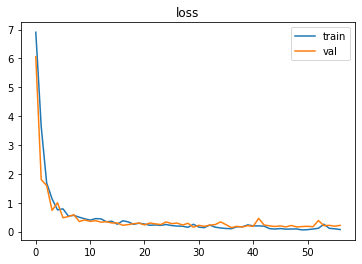

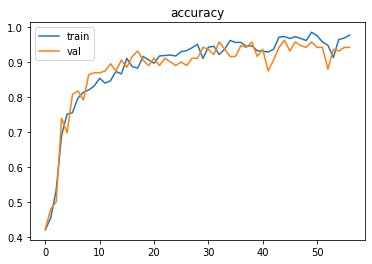

In [ ]:
plt.plot(train_lossli,label='train')
plt.plot(val_lossli,label='val')
plt.legend()
plt.title('loss')
plt.show()

plt.plot(train_accli,label='train')
plt.plot(val_accli,label='val')
plt.legend()
plt.title('accuracy')
plt.show()

In [ ]:
print('validate set:')
_=eval_on_test_set(net,valloader,selfatt=False,verbose=True)
print('test set:')
test_error=eval_on_test_set(net,testloader,selfatt=False,verbose=True)

validate set:
test accuracy  =  94.79166666666666 percent
test set:
test accuracy  =  86.93181818181817 percent


pred: 0  true: 0


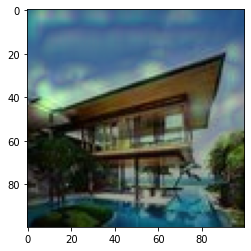

pred: 1  true: 1


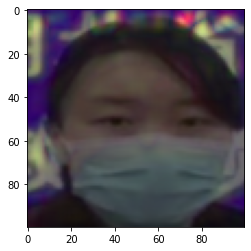

pred: 2  true: 2


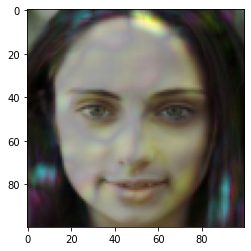

pred: 0  true: 0


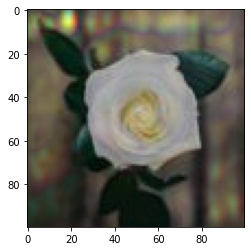

pred: 1  true: 1


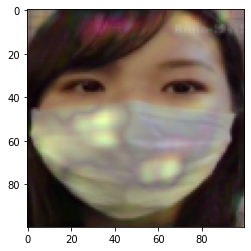

pred: 2  true: 2


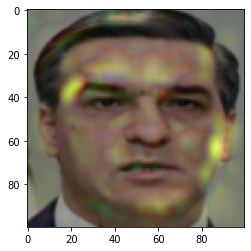

pred: 1  true: 0


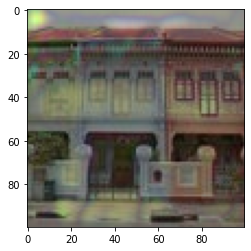

pred: 1  true: 1


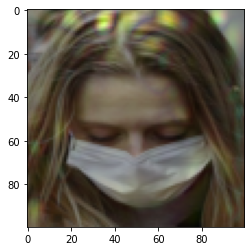

pred: 2  true: 2


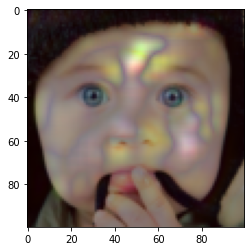

pred: 0  true: 0


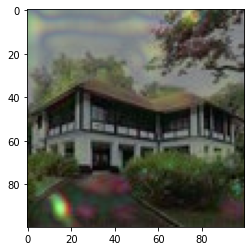

pred: 1  true: 2


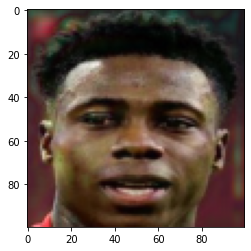

pred: 1  true: 1


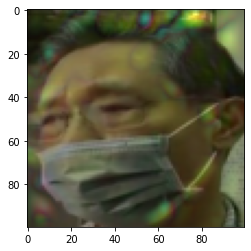

pred: 0  true: 0


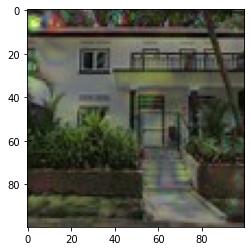

pred: 1  true: 1


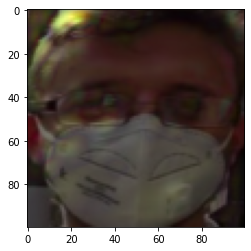

pred: 1  true: 0


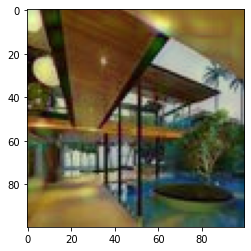

pred: 1  true: 1


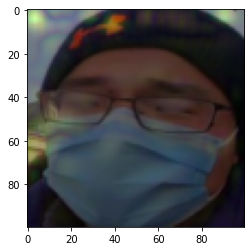

pred: 0  true: 0


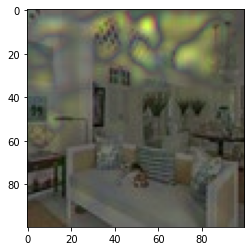

pred: 1  true: 1


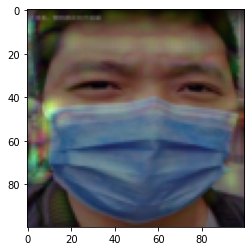

pred: 0  true: 0


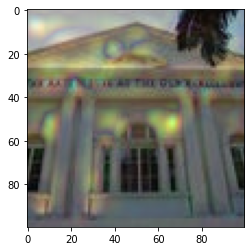

pred: 1  true: 1


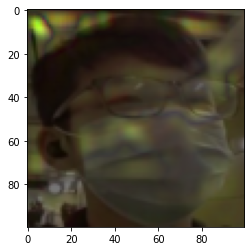

pred: 0  true: 0


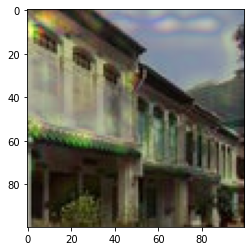

pred: 1  true: 2


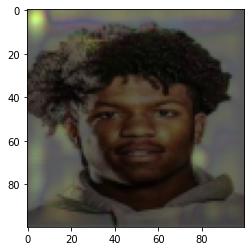

pred: 1  true: 1


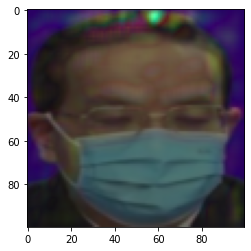

pred: 0  true: 0


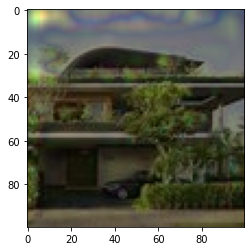

pred: 1  true: 1


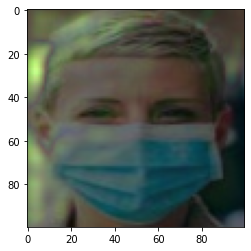

pred: 0  true: 0


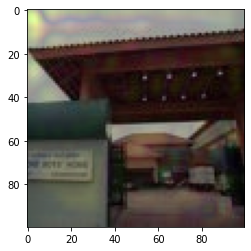

pred: 1  true: 1


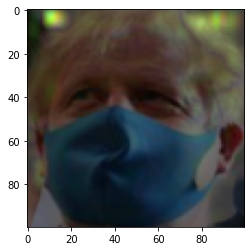

pred: 0  true: 0


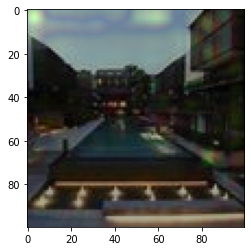

pred: 1  true: 1


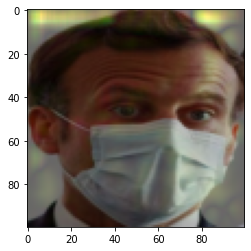

pred: 0  true: 0


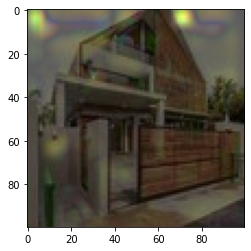

pred: 1  true: 1


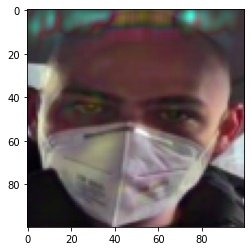

pred: 0  true: 0


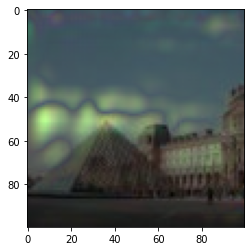

pred: 2  true: 2


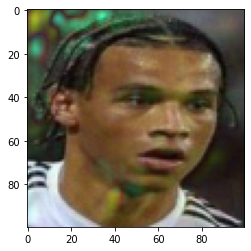

pred: 1  true: 1


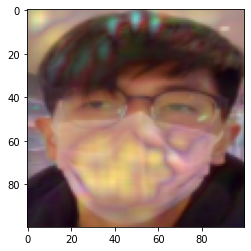

pred: 1  true: 0


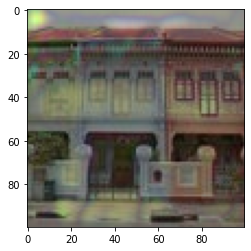

pred: 1  true: 1


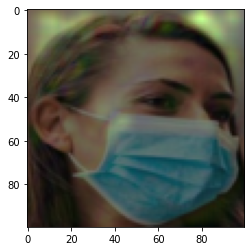

pred: 0  true: 0


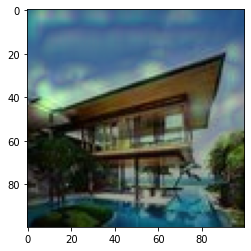

pred: 1  true: 1


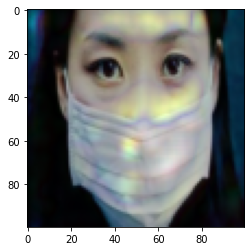

pred: 0  true: 0


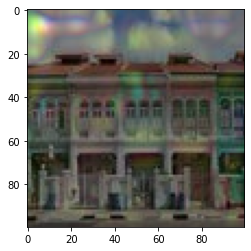

pred: 1  true: 1


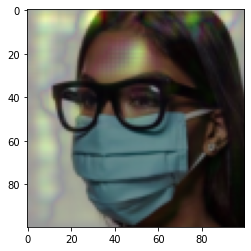

pred: 0  true: 0


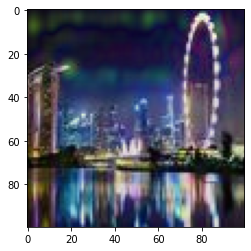

pred: 1  true: 1


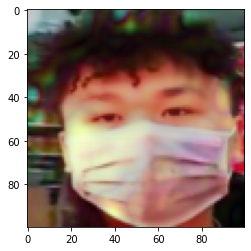

pred: 0  true: 0


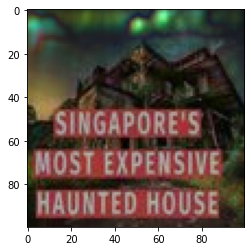

pred: 0  true: 2


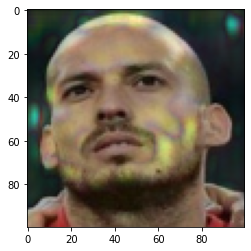

pred: 1  true: 1


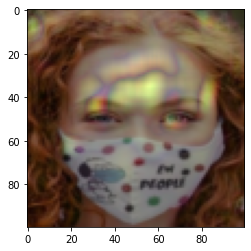

pred: 0  true: 0


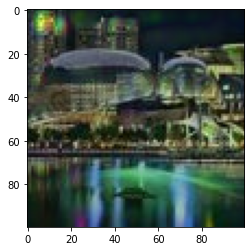

pred: 1  true: 1


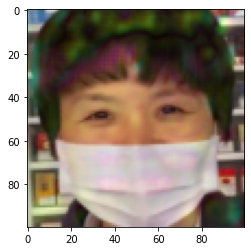

pred: 0  true: 0


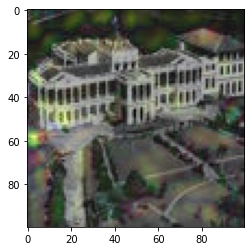

pred: 1  true: 1


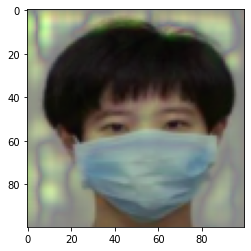

pred: 0  true: 0


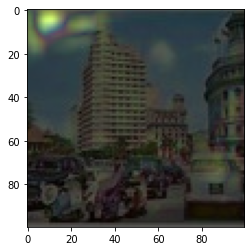

pred: 1  true: 1


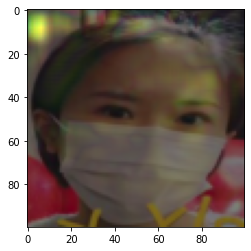

pred: 0  true: 0


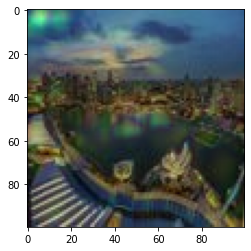

pred: 1  true: 1


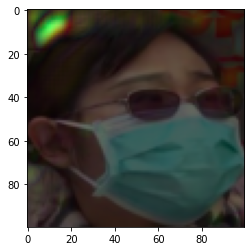

pred: 0  true: 0


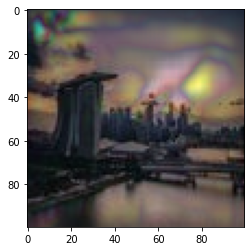

pred: 1  true: 2


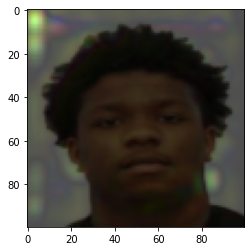

pred: 1  true: 1


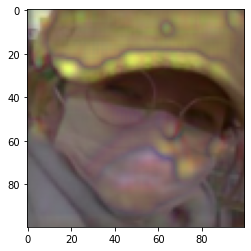

pred: 1  true: 0


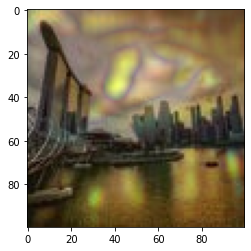

pred: 1  true: 1


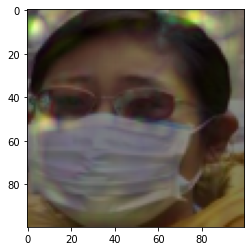

pred: 0  true: 0


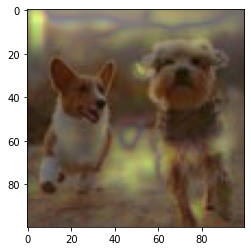

pred: 1  true: 1


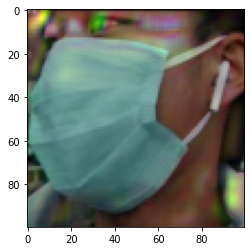

pred: 0  true: 0


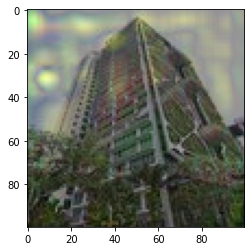

pred: 1  true: 1


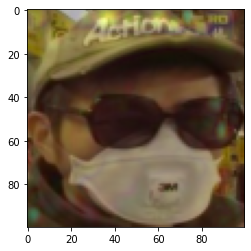

pred: 0  true: 0


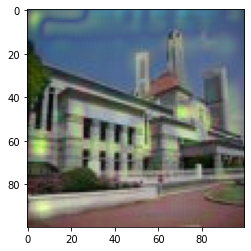

pred: 1  true: 1


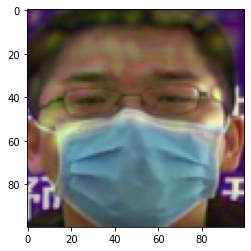

pred: 0  true: 0


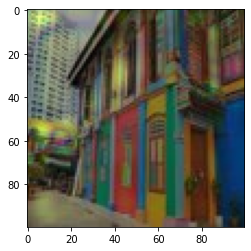

pred: 0  true: 2


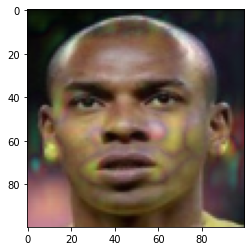

pred: 1  true: 1


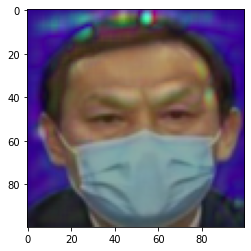

pred: 0  true: 0


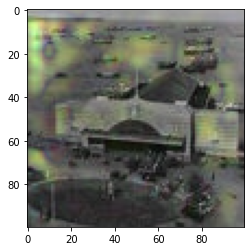

pred: 1  true: 1


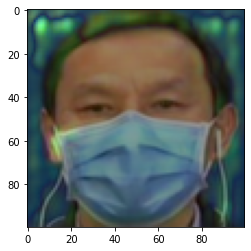

pred: 1  true: 0


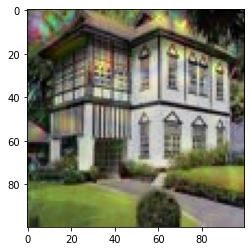

pred: 1  true: 1


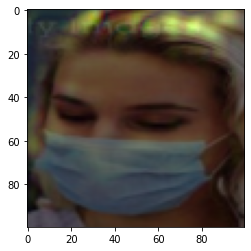

pred: 0  true: 0


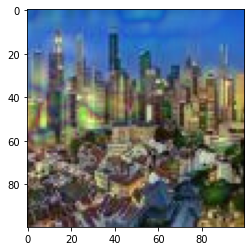

pred: 0  true: 0


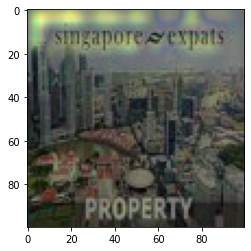

pred: 1  true: 0


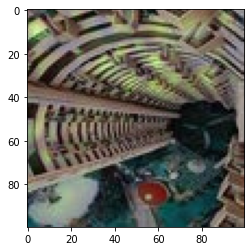

pred: 0  true: 0


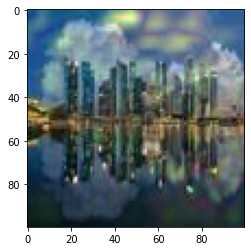

pred: 0  true: 0


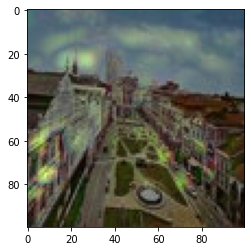

pred: 2  true: 2


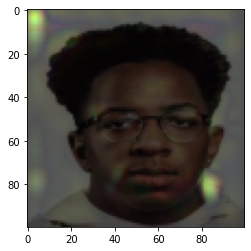

pred: 0  true: 0


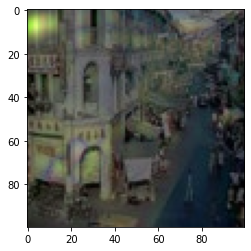

pred: 0  true: 0


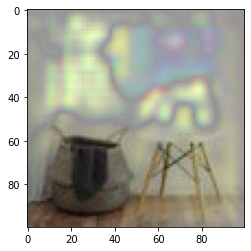

pred: 1  true: 0


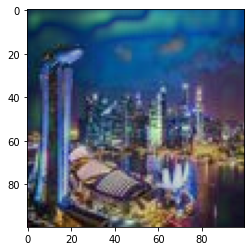

pred: 1  true: 0


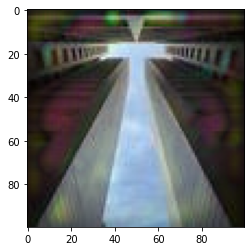

pred: 0  true: 0


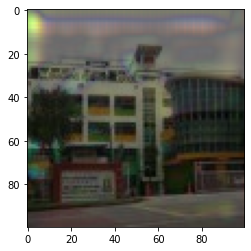

pred: 0  true: 0


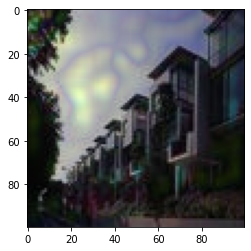

pred: 1  true: 0


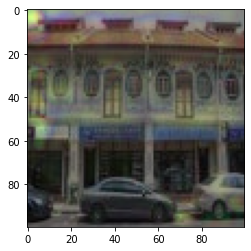

pred: 0  true: 2


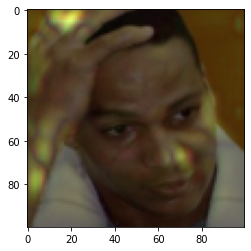

pred: 2  true: 2


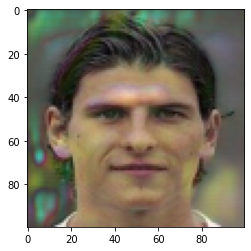

pred: 2  true: 2


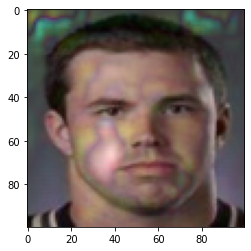

pred: 2  true: 2


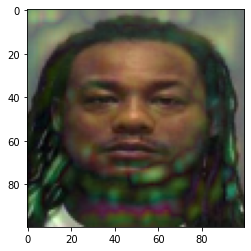

pred: 2  true: 2


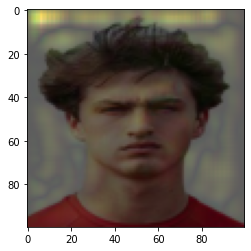

pred: 2  true: 2


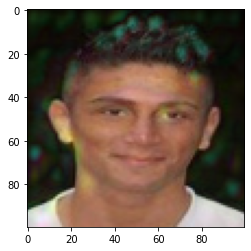

pred: 2  true: 2


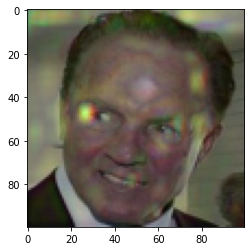

pred: 2  true: 2


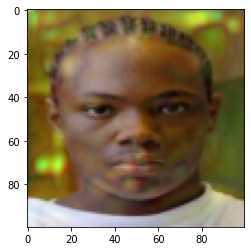

pred: 2  true: 2


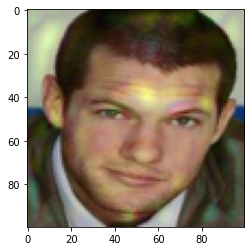

pred: 0  true: 2


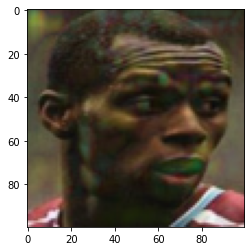

pred: 1  true: 2


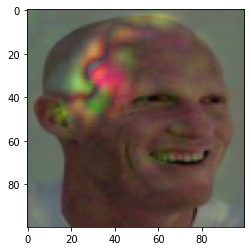

pred: 2  true: 2


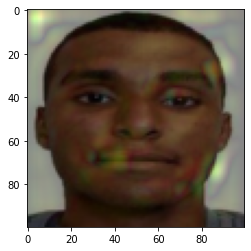

pred: 2  true: 2


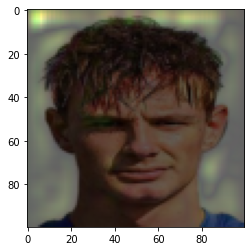

pred: 2  true: 2


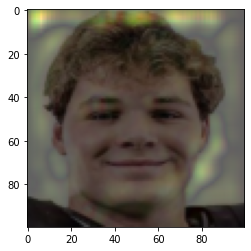

pred: 2  true: 2


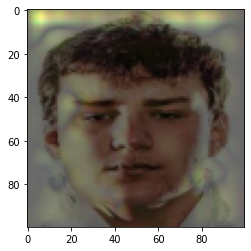

pred: 1  true: 2


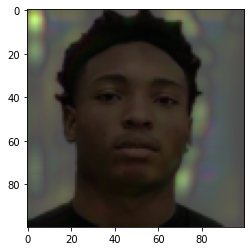

pred: 2  true: 2


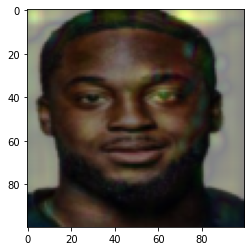

pred: 2  true: 2


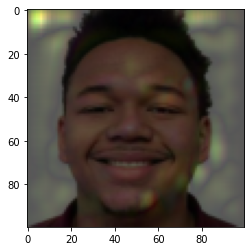

pred: 2  true: 2


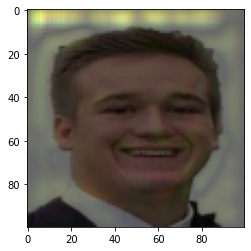

pred: 2  true: 2


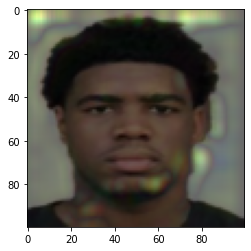

pred: 0  true: 2


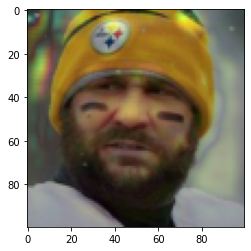

pred: 2  true: 2


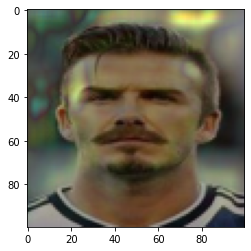

pred: 2  true: 2


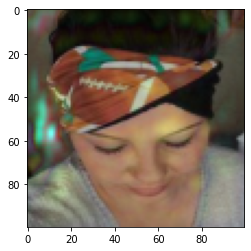

pred: 1  true: 2


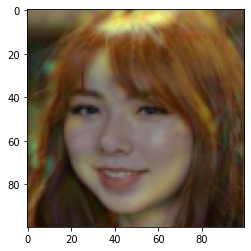

pred: 2  true: 2


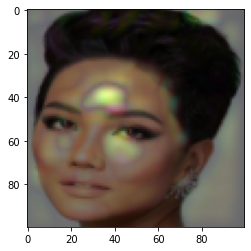

pred: 2  true: 2


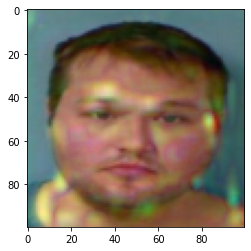

pred: 1  true: 2


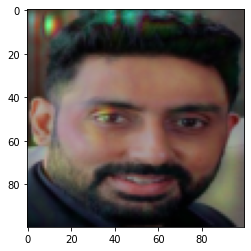

pred: 1  true: 1


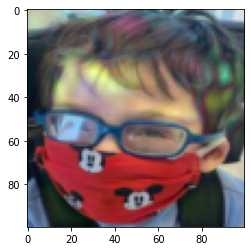

pred: 2  true: 2


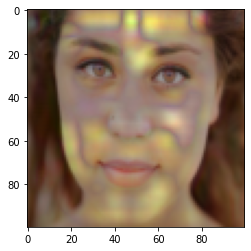

pred: 1  true: 1


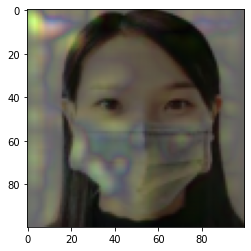

pred: 2  true: 2


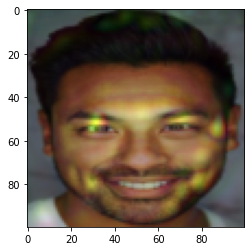

pred: 1  true: 1


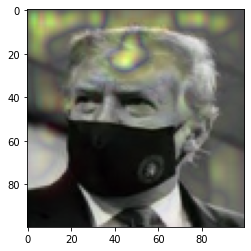

pred: 2  true: 2


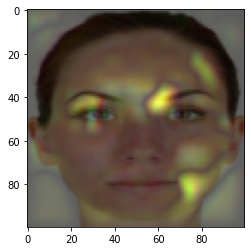

pred: 1  true: 1


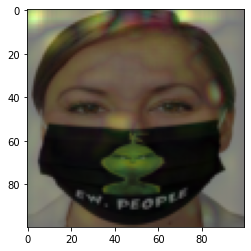

pred: 1  true: 2


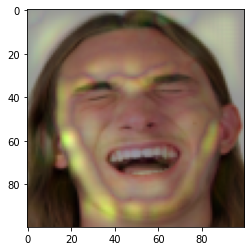

pred: 1  true: 1


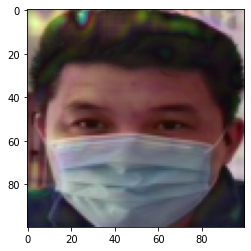

pred: 2  true: 2


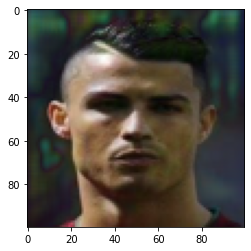

pred: 2  true: 2


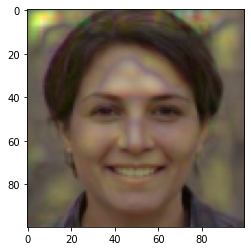

pred: 1  true: 1


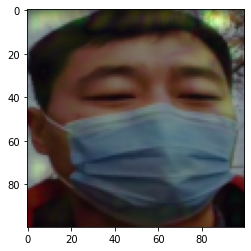

pred: 1  true: 2


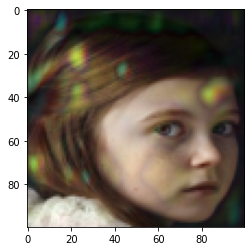

pred: 1  true: 1


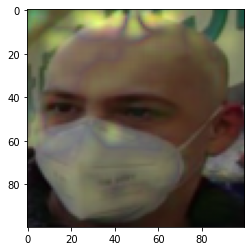

pred: 1  true: 2


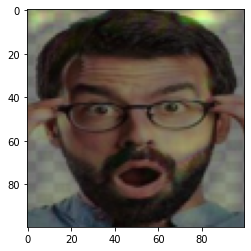

pred: 1  true: 1


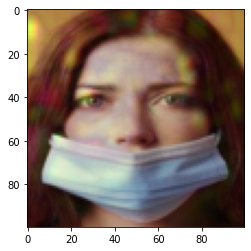

pred: 1  true: 2


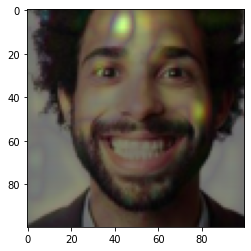

pred: 0  true: 1


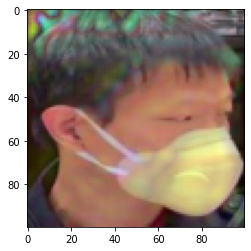

pred: 0  true: 2


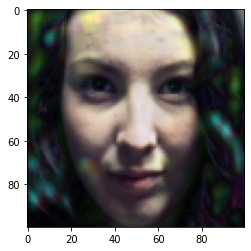

pred: 1  true: 1


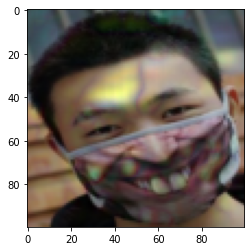

pred: 2  true: 2


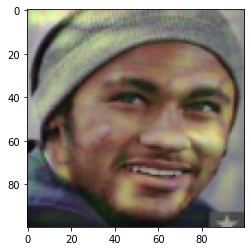

pred: 2  true: 2


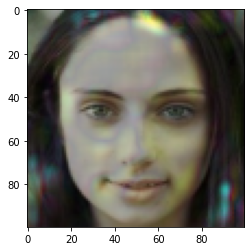

pred: 1  true: 0


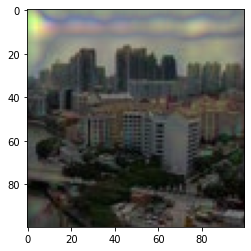

pred: 1  true: 1


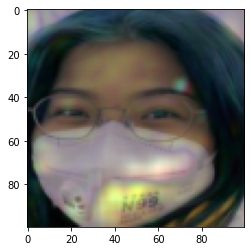

pred: 2  true: 2


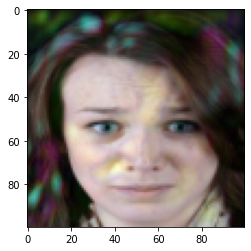

pred: 0  true: 0


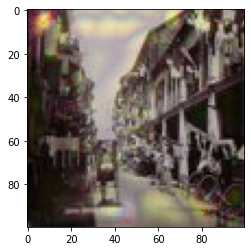

pred: 1  true: 1


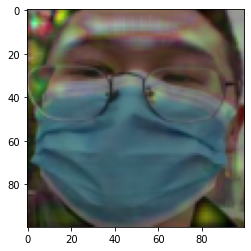

pred: 2  true: 2


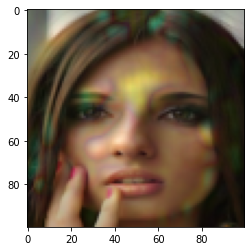

pred: 0  true: 0


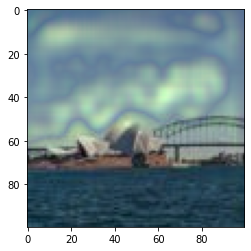

pred: 1  true: 1


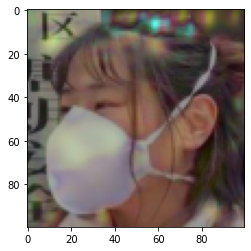

pred: 2  true: 2


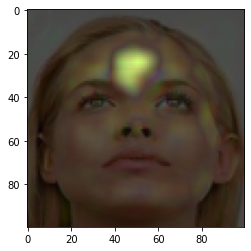

pred: 1  true: 2


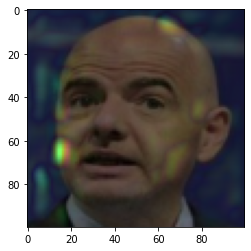

pred: 0  true: 0


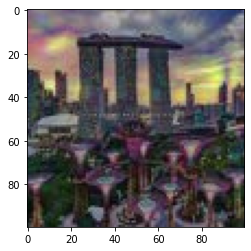

pred: 1  true: 1


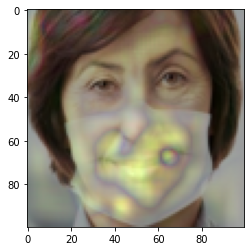

pred: 2  true: 2


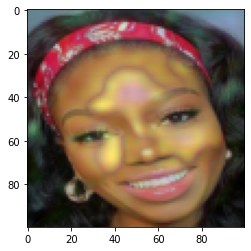

pred: 0  true: 0


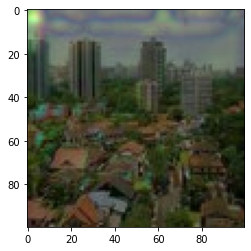

pred: 1  true: 1


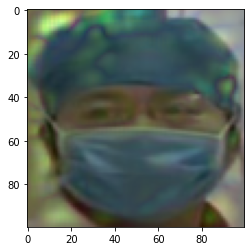

pred: 1  true: 2


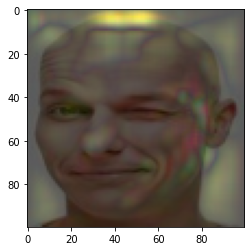

pred: 0  true: 0


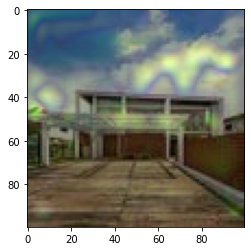

pred: 1  true: 1


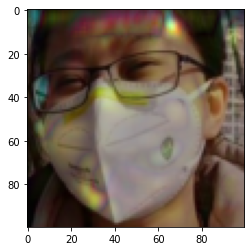

pred: 2  true: 2


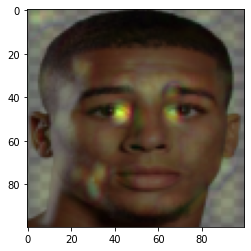

pred: 0  true: 0


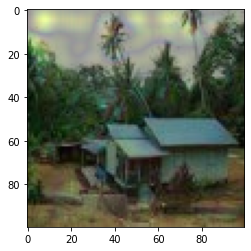

pred: 2  true: 2


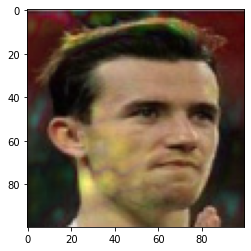

pred: 1  true: 1


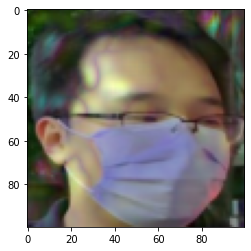

pred: 1  true: 2


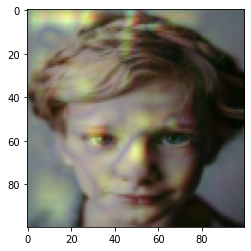

pred: 0  true: 0


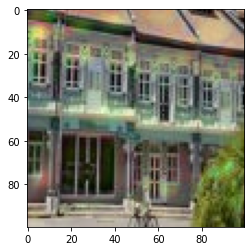

pred: 1  true: 1


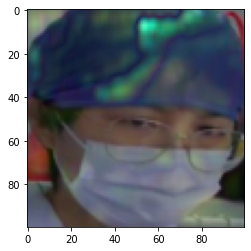

pred: 1  true: 2


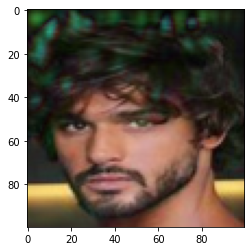

pred: 0  true: 0


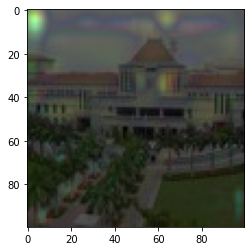

pred: 2  true: 1


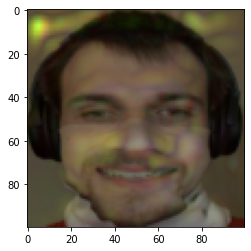

pred: 1  true: 2


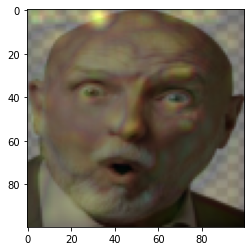

pred: 0  true: 0


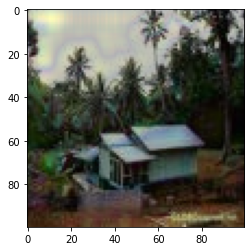

pred: 1  true: 1


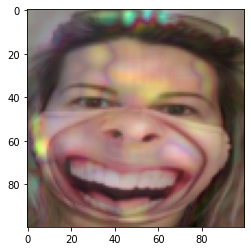

pred: 2  true: 2


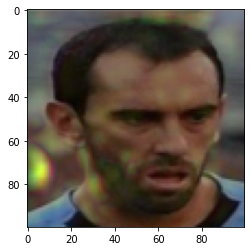

pred: 2  true: 2


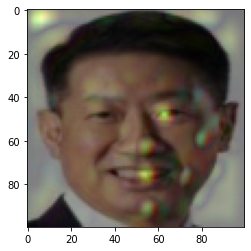

pred: 1  true: 0


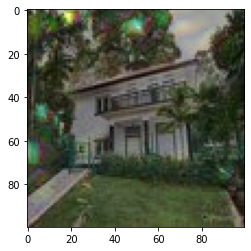

pred: 1  true: 1


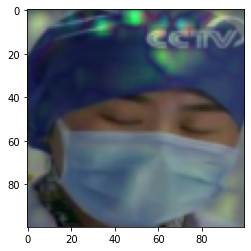

pred: 2  true: 2


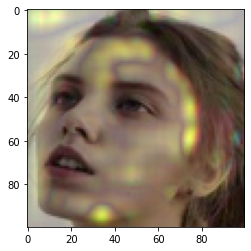

pred: 0  true: 0


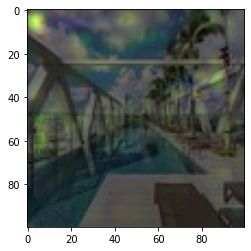

pred: 1  true: 1


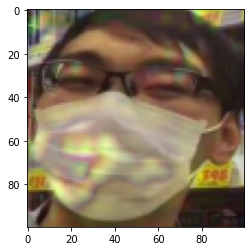

pred: 2  true: 2


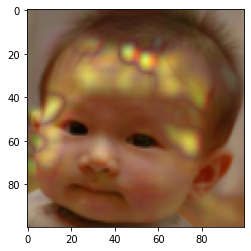

pred: 1  true: 0


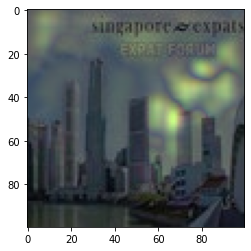

pred: 1  true: 1


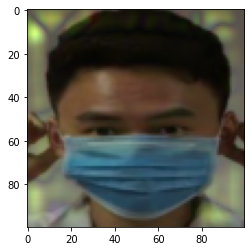

pred: 2  true: 2


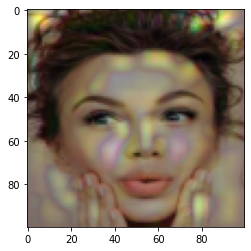

pred: 0  true: 2


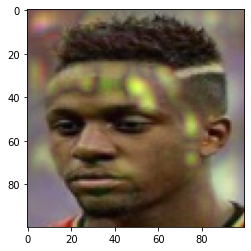

In [ ]:
dataloader_iterator = iter(testloader)
for data, target in dataloader_iterator:
    for i in range(len(data)):
        curimg=data[i]
        label=target[i]
        curinput=curimg.unsqueeze(0).to(device)
        x=Variable(curinput.float(),requires_grad=True)
        out,channel_att,spatial_att=net(x)
        ch_att_grad=torch.autograd.grad(channel_att, x, grad_outputs=channel_att.data.new(channel_att.shape).fill_(1),create_graph=True)[0]
        ch_att_grad_cpu=ch_att_grad[0].detach().cpu()
        ch_att_abs=torch.abs(ch_att_grad_cpu)

        sp_att_grad=torch.autograd.grad(spatial_att, x, grad_outputs=spatial_att.data.new(spatial_att.shape).fill_(1),create_graph=True)[0]
        sp_att_grad_cpu=sp_att_grad[0].detach().cpu()
        sp_att_abs=torch.abs(sp_att_grad_cpu)

        att_abs=ch_att_abs+sp_att_abs
        img_att=(0.8*curimg+0.1*torch.mean(curimg)/torch.mean(att_abs)*att_abs)
        img_att=((img_att - img_att.min())/(img_att.max() - img_att.min()))
        plt.imshow(  img_att.permute(1, 2, 0)  )
        print(f'pred: {torch.argmax(out)}  true: {label}')
        plt.show()

## Train <a name="train"></a>

#### 🥊 Select Model

In [ ]:
model_index = input("Please select which model you want to train? (input the number) \n 1. MLP\
     \n 2. CNN \n 3. CNN_RNN \n 4. ANN \n ")

## [!] Change those parameters as you want
model_index = int(model_index)
model = None
imgsize = 100
zoom_size = imgsize
batch_size = 64
num_epochs = 50
num_workers = 2
inplanes=3
planes=16
ca_ratio=2
sa_kernelsize=7
input_size=planes*32*9
output_size=3


if model_index == 1:
    model = mlp()
elif model_index == 2:
    model = cnn()
elif model_index == 3:
    model = CNNRNNModel()
elif model_index == 4:
    zoom_size = 120
    model = CBAM(inplanes, planes, ca_ratio, sa_kernelsize, input_size, output_size)
else:
    print("Bad input, please tray again")
    exit()

print("\n You selected the model: ", model_index, '\n')
model = model.to(device)
model.train()

Please select which model you want to train? (input the number) 
 1. MLP     
 2. CNN 
 3. CNN_RNN 
 4. ANN 
 3

 You selected the model:  CNN_RNN.pt 



CNNRNNModel(
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ReLU(inplace=True)
    (8): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (9): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (10): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (13): Conv2d(51

####🥊 Start training

In [ ]:


transform_train = Compose([ 
    transforms.Resize((zoom_size,zoom_size)),
    transforms.RandomCrop((imgsize,imgsize)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
])

transform_test = Compose([ 
    transforms.Resize((imgsize,imgsize)),
    transforms.ToTensor(),
])

train_set = FaceSet(is_train=True,transform=transform_train)
validation_set = FaceSet(is_train=False,transform=transform_train)


def train():

    train_loader = torch.utils.data.DataLoader(
        train_set, batch_size=batch_size, num_workers=num_workers, shuffle=True)
    validation_loader = torch.utils.data.DataLoader(
        validation_set, batch_size=batch_size, num_workers=num_workers, shuffle=True)
    lr = 0.01
    optimizer = torch.optim.SGD(model.parameters(), lr=lr, momentum=0.3)
    criterion = nn.CrossEntropyLoss()
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5, factor=0.5)

    # training loop
    for epoch in range(num_epochs):
        start_time = time.time()
        train_loss, val_loss = AverageMeter(), AverageMeter()
        train_acc, val_acc = AverageMeter(), AverageMeter()
        model.train()
        for i, (image, label) in enumerate(train_loader):
            image, label = image.to(device), label.to(device).view(-1)
            optimizer.zero_grad()
            image.requires_grad_()
            prediction = model(image)
            loss = criterion(prediction, label)
            train_loss.update(loss.detach().item())

            acc = topk_accuracy(1, prediction, label)
            train_acc.update(acc)

            loss.backward()
            optimizer.step()

            if i % 2 == 1:
                print(f'training: iteration {i} / {len(train_loader)}, avg train loss = {train_loss.avg:.4f}, '
                      f'train accuracy {train_acc.avg:.4f}')

        # validation
        model.eval()
        for i, (image, label) in enumerate(validation_loader):
            image, label = image.to(device), label.to(device).view(-1)      
                      
            with torch.no_grad():
                prediction = model(image)

                loss = criterion(prediction, label)
                val_loss.update(loss.item())

                acc = topk_accuracy(1, prediction, label)
                val_acc.update(acc)

            if i % 10 == 9:
                print(f'validation: iteration {i} / {len(validation_loader)}, avg val loss = {val_loss.avg:.4f}, '
                      f'val accuracy {val_acc.avg:.4f}')

        # epoch summary
        print(f'Epoch {epoch}, train error {train_loss.avg:.4f}, val error {val_loss.avg:.4f}. '
              f'Train acc = {train_acc.avg:.4f}, val acc = {val_acc.avg:.4f}. '
              f'Time cost {(time.time() - start_time) / 60:.2f} min.\n')

        # lr scheduler
        scheduler.step(val_loss.avg)

        # checkpoint
        if epoch % 2 == 1:
            torch.save(model.state_dict(), f'ckpt_e{epoch}.pth')

    torch.save(model.state_dict(), 'my_model.pt')


if __name__ == "__main__":
    train()
    print("Done")


## Evaluation <a name="evaluation"></a>
The training process was not easy and the result data was large, we just documented the result after training finished, and found the best combinations of parameters for our models, i
although still not enough, but training process was really time consuming. Luckily, we learnt a lot
during training:
1. Adam convergence is very fast than SGD but bad generalization
2 Start with small data set and val set is important
3. ”weigh decay” is an important L2-Reg param for SGD to prevent overfitting
4. Too much epochs are also causes some degradations.
5. Deeper and wider network architecture are easy to memorize whole data set

#### 🥊 Select Model

In [ ]:
cnn_rnn_model = 'CNN_RNN.pt'
mlp_model = 'MLP_small_50.pth'
cnn_model = 'CNN.pt'
ann_model = 'ANN.pt'

if not path.isfile(cnn_rnn_model):
    # Download CNN_RNN.pt
    !gdown https://drive.google.com/u/0/uc?id=1MH7OxLFves9m4qHk1In4RtLpXVsl0fk6

if not path.isfile(mlp_model):
    pass
    # Download CNN_RNN.pt
    !gdown https://drive.google.com/u/0/uc?id=1BOHn70s4XLfiDeg-26AEWLaSE-hmIJQT
if not path.isfile(cnn_model):
    pass
    # Download CNN_RNN.pt
    #!gdown https://drive.google.com/u/0/uc?id=1MH7OxLFves9m4qHk1In4RtLpXVsl0fk6
if not path.isfile(ann_model):
    pass
    # Download CNN_RNN.pt
    #!gdown https://drive.google.com/u/0/uc?id=1MH7OxLFves9m4qHk1In4RtLpXVsl0fk6

model_index = input("Please select which model you want to test? (input the number) \n 1. MLP\
     \n 2. CNN \n 3. CNN_RNN \n 4. ANN \n ")
model_index = int(model_index)
model = None
pretrained_model = None
imgsize = 100
zoom_size = imgsize

if model_index == 1:
    model = mlp()
    pretrained_model = mlp_model
elif model_index == 2:
    model = mlp()
    pretrained_model = cnn_model
elif model_index == 3:
    model = CNNRNNModel()
    pretrained_model = cnn_rnn_model
elif model_index == 4:
    model = CBAM(inplanes,planes,ca_ratio,sa_kernelsize,input_size,output_size)
    zoom_size = 120
    pretrained_model = ann_model
else:
    print("Bad input, please tray again")
    exit()

print("\n You selected the model: ",pretrained_model, '\n')
model = model.to(device)
model.eval()

Please select which model you want to test? (input the number) 
 1. MLP     
 2. CNN 
 3. CNN_RNN 
 4. ANN 
 1


TypeError: ignored

####🥊 Start Testing

loaded data from /content/drive/My Drive/cs5242_face_with_mask_detection/data/train/. dataset size 883
loaded data from /content/drive/My Drive/cs5242_face_with_mask_detection/data/test/. dataset size 176
test: iteration 1 / 9, test accuracy 0.9250
test: iteration 3 / 9, test accuracy 0.9375
test: iteration 5 / 9, test accuracy 0.9417
test: iteration 7 / 9, test accuracy 0.9438
evaluation finished, val acc 0.9500


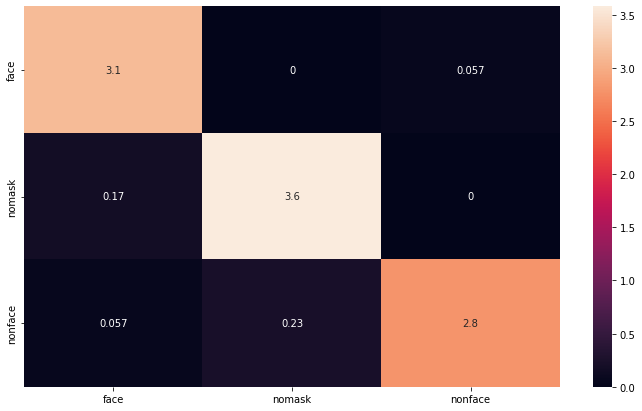

In [ ]:
import torch
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd

y_pred = []
y_true = []

def show(X):
    if X.dim() == 3 and X.size(0) == 3:
        plt.imshow( np.transpose(  X.numpy() , (1, 2, 0))  )
        plt.show()
    elif X.dim() == 2:
        plt.imshow(   X.numpy() , cmap='gray'  )
        plt.show()
    else:
        print('WRONG TENSOR SIZE')

transform_train = Compose([ 
    transforms.Resize((zoom_size,zoom_size)),
    transforms.RandomCrop((imgsize,imgsize)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
])

transform_test = Compose([ 
    transforms.Resize((imgsize,imgsize)),
    transforms.ToTensor(),
])

train_set = FaceSet(is_train=True,transform=transform_train)
test_set = FaceSet(is_train=False,transform=transform_train)

def test():
    batch_size = 20

    model.load_state_dict(torch.load(pretrained_model, map_location=device), strict=False)

    # mp.set_start_method('spawn', force=True)
    test_loader = torch.utils.data.DataLoader(test_set, batch_size=batch_size, \
                      shuffle=False)
    prt = True
    # test accuracy
    test_acc = AverageMeter()
    for i, (image, label) in enumerate(test_loader):
        image, label = image, label.view(-1)
        with torch.no_grad():
            prediction = model(image)
            if prt:
                prt = False
                _, pred = prediction.topk(1, 1, True)
                pred = pred.t()
                res = pred.eq(label).cpu().numpy()
                for idx, val in enumerate(res[0]):
                    if not val:
                        show(image[idx].cpu())
                        print("prediction:", torch.argmax(prediction[idx]))
            acc = topk_accuracy(1, prediction, label)
            test_acc.update(acc)
            output = (torch.max(torch.exp(prediction), 1)[1]).data.cpu().numpy()
            y_pred.extend(output) # Save Prediction
            label = label.data.cpu().numpy()
            y_true.extend(label) # Save Truth
            
        if i % 2 == 1:
            print(f'test: iteration {i} / {len(test_loader)}, '
                  f'test accuracy {test_acc.avg:.4f}')

    print(f'evaluation finished, val acc {test_acc.avg:.4f}')
    # constant for classes
    classes = ("face", "nomask", "nonface")

    # Build confusion matrix
    cf_matrix = confusion_matrix(y_true, y_pred)
    df_cm = pd.DataFrame(cf_matrix/np.sum(cf_matrix) *10, index = [i for i in classes],
                     columns = [i for i in classes])
    plt.figure(figsize = (12,7))
    sn.heatmap(df_cm, annot=True)
    plt.savefig('output.png')

if __name__ == "__main__":
    test()


## Conclusion <a name="conclusion"></a>

## References <a name="ref"></a>

* [1] [Dive into Deep Learning](http://d2l.ai/)

* [2] Kaiming He, Xiangyu Zhang, Shaoqing Ren, and Jian Sun. Deep residual learning for image recognition. CoRR, abs/1512.03385, 2015.

* [3] Sergey Ioffe and Christian Szegedy. Batch normalization: Accelerating deep network training by reducing internal covariate shift. CoRR, abs/1502.03167, 2015.

* [4] Alex Krizhevsky, Ilya Sutskever, and Geoffrey E. Hinton. Imagenet classification with
deep convolutional neural networks. NIPS’12, page 1097–1105, Red Hook, NY, USA,2012. Curran Associates Inc.

* [5] FeiFei Li. [Cnn architectures](http://cs231n.stanford.edu/slides/2021/)

* [6] Pytorch. [Torchvision.models](https://pytorch.org/vision/stable/index.html)

* [7] Nitish Srivastava, Geoffrey Hinton, Alex Krizhevsky, Ilya Sutskever, and Ruslan Salakhut-
dinov. Dropout: A simple way to prevent neural networks from overfitting. J. Mach.
Learn. Res., 15(1):1929–1958, January 2014.

* [8] Karen Simonyan and Andrew Zisserman. Very deep convolutional networks for large-
scale image recognition. In Yoshua Bengio and Yann LeCun, editors, 3rd International
5Conference on Learning Representations, ICLR 2015, San Diego, CA, USA, May 7-9,
2015, Conference Track Proceedings, 2015.